In [1]:
import torch
from torch.nn import CrossEntropyLoss
from torch.utils.data import DataLoader
import numpy as np
import os
import nrrd
import pytorch_lightning as pl #python -m pip install lightning
from monai.data import Dataset, DataLoader
from monai.transforms import Compose, Lambda, RandSpatialCrop, RandRotate90, ToTensor
from monai.networks.nets import AutoEncoder
#from monai.losses import DiceLoss
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from pytorch_lightning.callbacks import ModelCheckpoint
import torch.nn as nn
import torch.optim.lr_scheduler as lr_scheduler
import time

In [2]:
class SlicePlotter:
    def __init__(self):
        pass

    def plot_slices(self, original_slice, reconstruction_slice, title):
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(original_slice, cmap='gray')
        plt.title(f'Original {title} Slice')
        plt.subplot(1, 2, 2)
        plt.imshow(reconstruction_slice, cmap='gray')
        plt.title(f'Reconstructed {title} Slice')
        plt.show()

class VolumePlotter:
    def __init__(self):
        self.color_map = np.array([
            [0, 0, 0, 0],      # Transparent for background (0)
            [255, 0, 0, 255],  # Red for arteries (1)
            [0, 0, 255, 255]   # Blue for veins (2)
        ], dtype=np.uint8)
        self.downsample_factor = 2

    def plot_volumes(self, original_volume, reconstruction_volume, title):
        # Downsample original volume
        original_volume_downsampled = original_volume[::self.downsample_factor, 
                                                       ::self.downsample_factor, 
                                                       ::self.downsample_factor]

        # Downsample reconstructed volume
        reconstruction_volume_downsampled = reconstruction_volume[::self.downsample_factor, 
                                                                   ::self.downsample_factor, 
                                                                   ::self.downsample_factor]

        # Downsample color map along the first axis to match the number of unique values in the downsampled volume
        color_map_downsampled = self.color_map[:len(np.unique(original_volume_downsampled))]

        # Plot original and reconstructed volumes with titles using Matplotlib
        fig = plt.figure(figsize=(10, 5))

        # Plot original volume with assigned colors and no edge color
        ax1 = fig.add_subplot(121, projection='3d')
        ax1.set_title(f'Original {title} Volume')

        # Define colors for each voxel value in the original volume using the downsampled color map
        original_colors = np.take(color_map_downsampled, original_volume_downsampled, axis=0) / 255.0
        ax1.voxels(original_volume_downsampled, facecolors=original_colors)

        # Plot reconstructed volume with assigned colors and no edge color
        ax2 = fig.add_subplot(122, projection='3d')
        ax2.set_title(f'Reconstructed {title} Volume')

        # Define colors for each voxel value in the reconstructed volume using the downsampled color map
        reconstruction_colors = np.take(color_map_downsampled, reconstruction_volume_downsampled, axis=0) / 255.0
        ax2.voxels(reconstruction_volume_downsampled, facecolors=reconstruction_colors)

        plt.show()

class AutoEncoderModel(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.autoencoder = AutoEncoder(
            spatial_dims=3, 
            in_channels=1, 
            out_channels=3,  # Output channels set to 3
            channels=(16, 32, 64, 128, 1), 
            strides=(2, 2, 2, 2, 2), 
            kernel_size=3, 
            num_res_units=2
        )
        # Define class weights
        class_weights = torch.tensor([0.2, 0.4, 0.4])
        self.loss_function = nn.CrossEntropyLoss(weight=class_weights)
        self.volume_plotter = VolumePlotter()  # Instantiate VolumePlotter

    def forward(self, x):
        return self.autoencoder(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        x, y = x.to(device), y.to(device)
        x_hat = self(x)
        loss = self.loss_function(x_hat, y.squeeze(1).long())
        self.log('train_loss', loss)

        if (self.current_epoch) % 300 == 0 and batch_idx == 0:
            original_volume = x[0, 0, :, :, :].detach().cpu().numpy().astype(int)  
            reconstruction_volume = np.argmax(x_hat[0,:,:,:,:].detach().cpu().numpy(), axis=0)
            self.volume_plotter.plot_volumes(original_volume, reconstruction_volume, 'Train')

        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        x, y = x.to(device), y.to(device)
        x_hat = self(x)
        loss = self.loss_function(x_hat, y.squeeze(1).long())
        self.log('val_loss', loss, prog_bar=True)

        if (self.current_epoch) % 300 == 0 and batch_idx == 0:
            original_volume = x[0, 0, :, :, :].detach().cpu().numpy().astype(int)  
            reconstruction_volume = np.argmax(x_hat[0,:,:,:,:].detach().cpu().numpy(), axis=0)
            self.volume_plotter.plot_volumes(original_volume, reconstruction_volume, 'Val')
            torch.save(model.state_dict(), folder_path + '/autoencoder.pth')

        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-3)
        return optimizer

class MyDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.files = [f for f in os.listdir(data_dir) if f.endswith('.nrrd')]

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        file_path = os.path.join(self.data_dir, self.files[idx])
        data, header = nrrd.read(file_path)
        if self.transform:
            data = self.transform(data)
        return data, data

# Define a custom callback to plot both training and validation losses

class PlotLossCallback(pl.Callback):
    def __init__(self, log_dir):
        super().__init__()
        self.log_dir = log_dir

    def on_train_start(self, trainer, pl_module):
        # Clear previous graphs
        #tf.compat.v1.reset_default_graph()
        self.writer = SummaryWriter(self.log_dir)

    def on_train_epoch_end(self, trainer, pl_module, **kwargs):
        epoch = trainer.current_epoch
        train_loss = trainer.callback_metrics['train_loss'].cpu().item()
        val_loss = trainer.callback_metrics['val_loss'].cpu().item()

        # Write both training and validation loss to the same graph with epoch as global step
        self.writer.add_scalars('MAE Job 15 Loss', {'training' : train_loss, 
                                                   'validation' : val_loss }, global_step=epoch +1 )
        time_spent = time.time() - start_time
        print(f"Time Spent {time_spent:.2f}")
    def on_train_end(self, trainer, pl_module):
        self.writer.close()

transform = Compose([
    Lambda(func=lambda x: np.expand_dims(x, 0) if x.ndim == 3 else x),
    RandSpatialCrop((256, 256, 256), random_size=False),
    RandRotate90(prob=0.5),
    ToTensor(dtype=torch.float32)
])

start_time = time.time()
device = torch.device("cuda" if torch.cuda.is_available() else "gpu")

folder_path = "./Models"
if not os.path.exists(folder_path):
        os.makedirs(folder_path)

# Define dataset and data loaders for both training and validation sets
train_data_dir = "../../TrainFullLabels70"
val_data_dir   = "../../ValFullLabels30"

train_dataset = MyDataset(train_data_dir, transform)
val_dataset   = MyDataset(val_data_dir  , transform)

train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True , num_workers=2) #############################
val_dataloader   = DataLoader(val_dataset  , batch_size=2, shuffle=False, num_workers=2)


#early_stop_callback = pl.callbacks.EarlyStopping(monitor='val_loss', patience=80)
#getting rid of early stop callback for now 
# Define Lightning trainer

trainer = pl.Trainer(
    max_epochs=1501,
    callbacks=[PlotLossCallback("../../logs/")],
    profiler='simple')


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


Missing logger folder: /old_Users/tgafrick/RA4/jobs/MAEjob15/lightning_logs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



  | Name          | Type             | Params
---------------------------------------------------
0 | autoencoder   | AutoEncoder      | 2.1 M 
1 | loss_function | CrossEntropyLoss | 0     
---------------------------------------------------
2.1 M     Trainable params
0         Non-trainable params
2.1 M     Total params
8.240     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

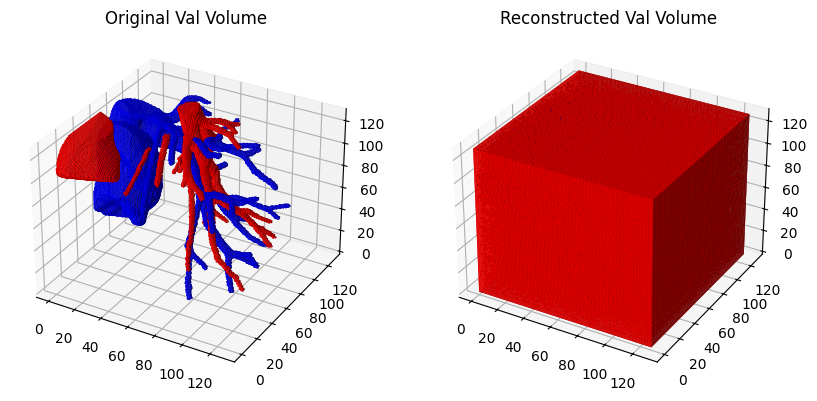

/old_Users/tgafrick/RA4/.venvE/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (9) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

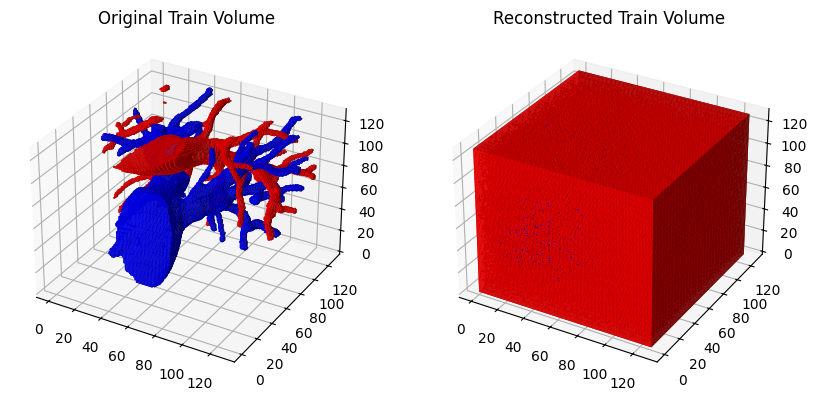

Validation: |          | 0/? [00:00<?, ?it/s]

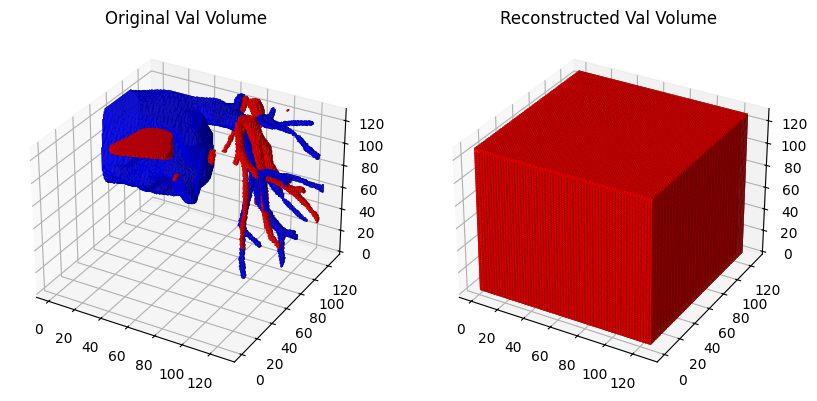

Time Spent 5152.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5189.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5229.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5266.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5302.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5337.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5372.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5408.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5443.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5478.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5513.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5548.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5584.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5620.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5657.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5694.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5731.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5766.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5801.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5838.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5873.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5908.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5943.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5977.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6012.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6049.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6085.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6120.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6155.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6190.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6225.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6261.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6296.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6333.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6368.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6402.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6437.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6472.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6509.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6544.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6579.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6614.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6651.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6687.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6722.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6756.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6791.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6826.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6861.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6899.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6933.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6968.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7003.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7041.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7076.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7114.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7149.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7183.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7218.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7255.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7289.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7325.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7360.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7395.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7429.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7464.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7498.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7536.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7572.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7607.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7641.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7676.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7713.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7749.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7784.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7819.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7854.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7888.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7923.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7960.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7995.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8030.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8065.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8101.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8138.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8172.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8207.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8244.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8279.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8314.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8348.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8384.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8418.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8454.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8488.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8524.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8559.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8594.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8628.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8665.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8700.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8736.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8771.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8808.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8842.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8879.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8914.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8949.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8986.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9021.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9057.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9092.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9127.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9162.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9197.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9233.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9268.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9304.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9340.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9377.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9413.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9448.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9485.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9519.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9554.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9590.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9626.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9661.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9697.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9733.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9768.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9805.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9842.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9878.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9914.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9949.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9986.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10021.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10056.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10093.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10128.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10163.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10198.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10233.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10268.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10303.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10338.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10372.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10407.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10445.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10479.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10514.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10550.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10585.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10621.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10658.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10693.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10728.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10764.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10798.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10834.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10869.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10905.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10940.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10975.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11011.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11045.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11080.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11115.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11151.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11188.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11223.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11260.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11296.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11334.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11371.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11409.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11446.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11484.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11522.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11558.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11597.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11635.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11672.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11709.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11749.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11785.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11821.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11863.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11898.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11932.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11993.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12029.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12070.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12116.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12151.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12187.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12224.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12259.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12296.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12331.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12367.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12404.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12439.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12475.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12510.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12545.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12579.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12615.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12651.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12687.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12721.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12760.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12832.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12868.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12903.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12940.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12977.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13012.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13048.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13082.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13118.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13155.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13190.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13227.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13263.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13308.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13343.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13378.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13417.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13452.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13489.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13524.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13561.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13597.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13632.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13669.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13703.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13739.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13774.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13810.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13845.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13882.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13917.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13954.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13989.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14024.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14061.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14096.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14133.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14168.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14203.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14238.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14272.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14307.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14343.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14379.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14413.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14449.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14484.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14519.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14554.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14591.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14626.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14660.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14696.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14731.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14765.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14800.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14835.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14870.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14905.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14940.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14976.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15012.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15047.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15082.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15117.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15151.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15186.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15221.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15258.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15293.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15328.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15365.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15399.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15434.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15471.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15505.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15541.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15576.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15611.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15647.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15682.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15716.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15751.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15786.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15823.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15858.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15896.37


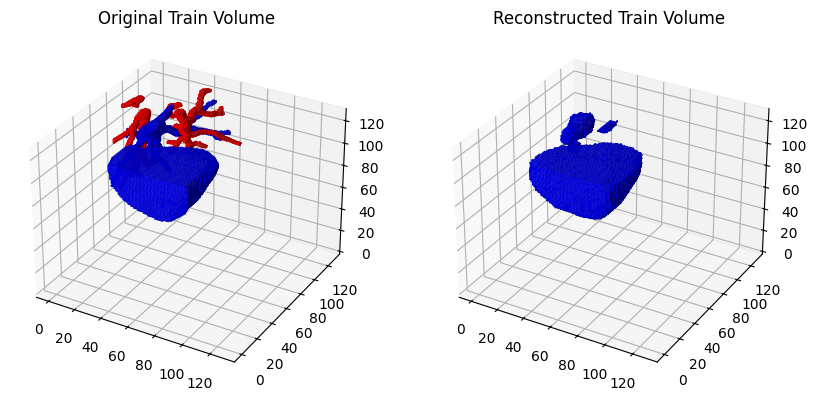

Validation: |          | 0/? [00:00<?, ?it/s]

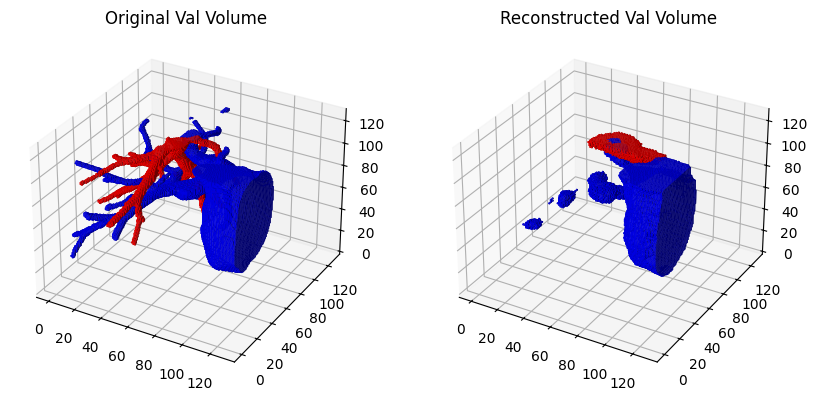

Time Spent 16217.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16253.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16289.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16324.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16361.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16396.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16431.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16466.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16501.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16536.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16573.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16610.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16645.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16680.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16716.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16751.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16787.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16822.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16861.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16896.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16932.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16968.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17004.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17039.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17075.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17110.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17145.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17180.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17215.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17250.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17285.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17321.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17356.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17391.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17427.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17462.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17497.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17531.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17568.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17603.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17639.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17674.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17708.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17743.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17779.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17814.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17849.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17884.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17921.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17960.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17995.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18030.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18066.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18100.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18136.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18171.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18207.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18242.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18277.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18313.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18351.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18386.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18423.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18458.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18493.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18528.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18564.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18599.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18634.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18669.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18704.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18738.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18775.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18810.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18846.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18883.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18919.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18954.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18989.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19024.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19060.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19096.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19131.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19166.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19201.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19236.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19271.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19307.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19342.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19376.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19413.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19449.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19487.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19523.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19559.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19595.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19630.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19667.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19703.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19742.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19778.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19812.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19848.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19883.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19918.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19953.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19988.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20023.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20059.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20094.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20129.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20165.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20200.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20235.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20271.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20308.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20344.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20381.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20415.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20451.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20488.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20525.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20562.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20599.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20634.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20668.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20703.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20738.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20773.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20807.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20842.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20879.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20914.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20951.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20987.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21022.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21059.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21096.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21133.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21170.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21205.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21240.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21274.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21312.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21348.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21385.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21420.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21456.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21492.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21531.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21566.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21601.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21635.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21672.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21708.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21743.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21778.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21814.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21850.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21886.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21922.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21957.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21992.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22027.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22063.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22098.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22133.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22169.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22203.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22238.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22273.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22309.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22343.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22381.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22416.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22451.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22487.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22522.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22557.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22593.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22627.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22664.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22698.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22734.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22769.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22804.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22839.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22874.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22909.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22944.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22979.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23016.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23050.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23086.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23121.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23156.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23191.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23225.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23260.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23299.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23334.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23369.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23403.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23438.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23473.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23508.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23543.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23580.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23616.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23650.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23687.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23722.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23759.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23794.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23831.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23866.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23901.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23936.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23971.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24007.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24041.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24076.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24111.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24146.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24181.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24216.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24251.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24287.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24321.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24357.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24391.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24426.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24461.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24496.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24531.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24567.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24602.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24637.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24671.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24707.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24742.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24777.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24813.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24848.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24883.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24919.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24955.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24990.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25025.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25063.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25099.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25133.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25169.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25204.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25239.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25276.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25313.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25348.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25384.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25418.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25453.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25487.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25524.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25560.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25595.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25630.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25666.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25701.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25735.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25770.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25806.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25842.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25877.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25913.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25948.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25983.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26018.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26054.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26090.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26124.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26159.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26195.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26230.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26264.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26299.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26335.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26371.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26406.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26442.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26477.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26512.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26551.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26586.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26621.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26656.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26691.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26726.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26761.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26796.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26833.34


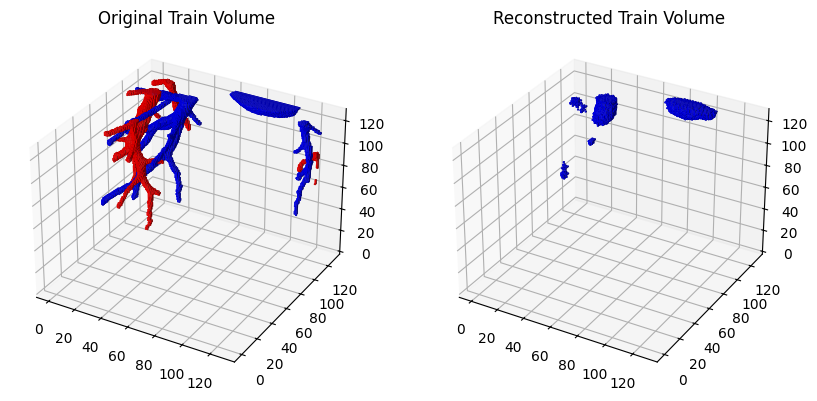

Validation: |          | 0/? [00:00<?, ?it/s]

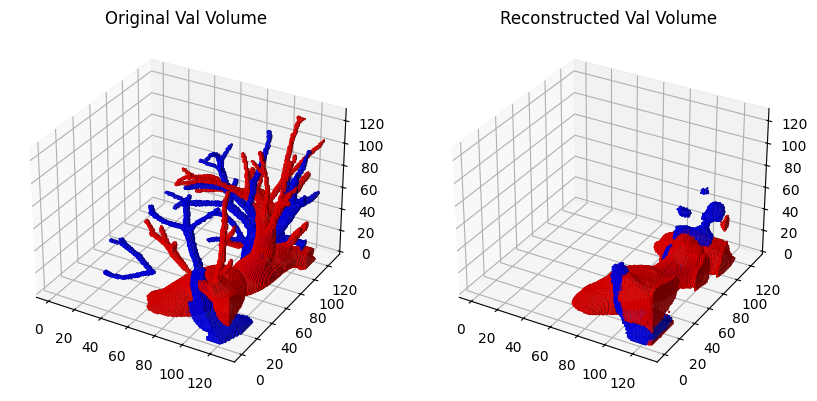

Time Spent 27137.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27172.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27207.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27244.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27278.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27313.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27348.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27384.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27420.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27456.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27492.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27528.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27563.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27598.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27634.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27670.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27704.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27739.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27776.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27811.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27847.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27882.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27918.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27953.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27988.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28023.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28058.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28093.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28130.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28166.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28203.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28239.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28274.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28312.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28348.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28383.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28420.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28457.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28492.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28527.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28562.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28598.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28633.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28669.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28704.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28740.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28775.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28812.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28847.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28885.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28921.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28958.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28993.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29028.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29063.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29099.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29136.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29174.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29212.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29248.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29285.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29320.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29355.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29392.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29427.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29463.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29498.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29532.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29568.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29603.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29639.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29674.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29709.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29744.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29781.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29816.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29851.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29888.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29923.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29959.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29994.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30029.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30064.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30100.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30135.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30169.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30203.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30239.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30274.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30309.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30344.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30379.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30417.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30452.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30487.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30522.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30557.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30592.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30628.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30665.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30700.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30737.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30772.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30808.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30844.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30878.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30914.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30948.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30983.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31020.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31055.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31091.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31127.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31162.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31199.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31234.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31270.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31305.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31340.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31375.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31411.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31446.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31482.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31517.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31552.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31587.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31622.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31657.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31692.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31729.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31764.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31799.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31834.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31869.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31905.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31940.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31975.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32013.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32049.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32084.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32119.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32154.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32191.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32226.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32262.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32298.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32334.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32370.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32405.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32442.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32479.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32514.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32549.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32584.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32619.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32654.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32690.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32724.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32759.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32796.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32831.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32866.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32902.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32938.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32974.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33008.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33044.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33078.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33113.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33148.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33184.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33220.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33255.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33290.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33325.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33360.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33397.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33432.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33469.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33504.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33539.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33575.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33611.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33650.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33685.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33720.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33755.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33791.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33826.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33862.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33896.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33932.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33968.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34003.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34038.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34073.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34108.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34143.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34178.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34216.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34251.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34286.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34322.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34357.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34392.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34428.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34462.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34498.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34532.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34568.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34602.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34639.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34674.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34709.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34745.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34780.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34817.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34852.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34889.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34924.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34958.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34993.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35030.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35064.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35099.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35134.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35169.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35205.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35242.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35277.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35314.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35350.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35386.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35422.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35457.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35492.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35528.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35564.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35600.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35635.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35670.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35706.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35744.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35780.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35814.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35849.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35887.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35923.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35958.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35997.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36033.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36069.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36104.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36140.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36174.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36210.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36245.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36279.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36315.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36350.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36385.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36420.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36457.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36491.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36526.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36561.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36596.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36630.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36666.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36701.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36737.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36772.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36807.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36842.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36878.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36913.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36947.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36983.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37018.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37053.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37088.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37123.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37158.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37193.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37231.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37266.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37303.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37339.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37373.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37411.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37446.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37482.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37519.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37556.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37593.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37628.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37663.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37698.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37733.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37770.49


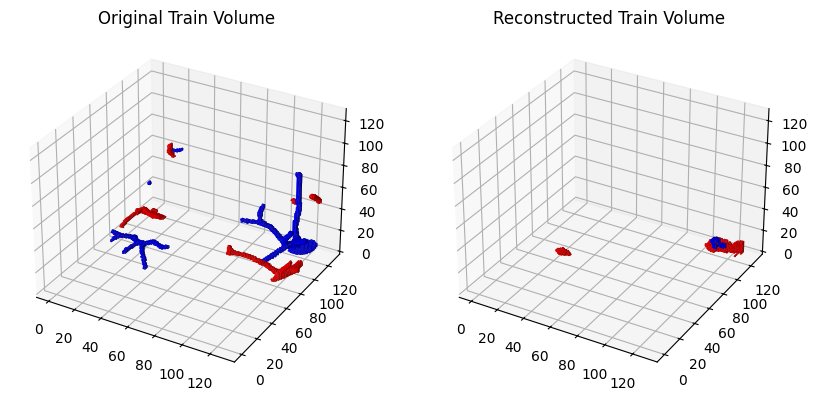

Validation: |          | 0/? [00:00<?, ?it/s]

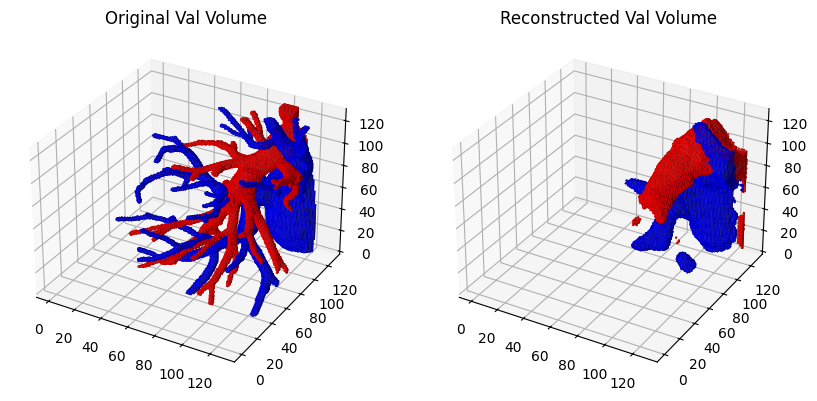

Time Spent 38155.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38189.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38224.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38259.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38293.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38327.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38362.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38396.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38432.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38466.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38502.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38536.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38571.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38605.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38640.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38675.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38710.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38745.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38779.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38812.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38846.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38881.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38915.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38949.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38983.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39016.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39052.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39087.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39120.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39153.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39187.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39220.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39254.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39288.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39322.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39357.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39392.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39426.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39460.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39493.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39527.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39561.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39596.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39630.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39663.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39698.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39734.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39769.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39803.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39838.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39872.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39906.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39941.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39975.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40009.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40043.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40076.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40110.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40143.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40177.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40212.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40248.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40281.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40315.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40348.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40381.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40416.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40450.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40486.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40519.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40552.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40586.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40620.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40656.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40691.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40725.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40758.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40792.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40825.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40860.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40894.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40927.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40960.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40994.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41028.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41061.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41096.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41132.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41167.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41202.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41236.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41269.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41304.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41339.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41375.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41408.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41444.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41479.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41514.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41550.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41583.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41617.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41652.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41686.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41720.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41753.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41788.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41822.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41855.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41890.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41924.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41958.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41992.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42026.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42059.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42092.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42126.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42160.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42193.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42227.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42261.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42295.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42328.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42363.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42397.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42430.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42465.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42500.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42533.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42568.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42602.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42635.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42669.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42703.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42737.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42772.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42807.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42840.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42874.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42908.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42942.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42976.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43009.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43044.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43080.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43115.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43149.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43183.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43217.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43253.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43287.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43321.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43355.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43389.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43422.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43455.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43489.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43522.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43555.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43589.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43623.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43656.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43689.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43724.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43758.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43793.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43828.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43861.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43895.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43929.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43965.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43999.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44034.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44070.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44105.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44139.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44173.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44206.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44239.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44272.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44306.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44340.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44373.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44408.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44442.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44477.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44511.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44546.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44581.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44614.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44649.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44683.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44717.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44751.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44785.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44818.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44854.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44888.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44922.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44957.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44993.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45027.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45060.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45096.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45130.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45164.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45199.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45232.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45265.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45300.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45334.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45368.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45403.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45437.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45473.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45508.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45543.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45577.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45612.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45645.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45680.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45715.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45749.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45783.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45820.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45853.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45887.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45920.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45955.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45991.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46024.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46058.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46092.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46127.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46160.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46193.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46228.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46262.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46295.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46329.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46362.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46397.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46431.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46464.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46498.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46531.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46565.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46599.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46634.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46670.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46704.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46741.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46774.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46808.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46841.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46875.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46909.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46942.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46976.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47009.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47042.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47078.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47112.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47146.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47179.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47212.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47247.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47280.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47316.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47350.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47384.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47417.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47452.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47485.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47519.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47553.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47586.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47619.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47652.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47685.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47719.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47752.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47787.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47821.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47854.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47889.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47924.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47957.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47991.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48024.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48058.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48093.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48126.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48160.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48194.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48228.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48262.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48297.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48331.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48367.21


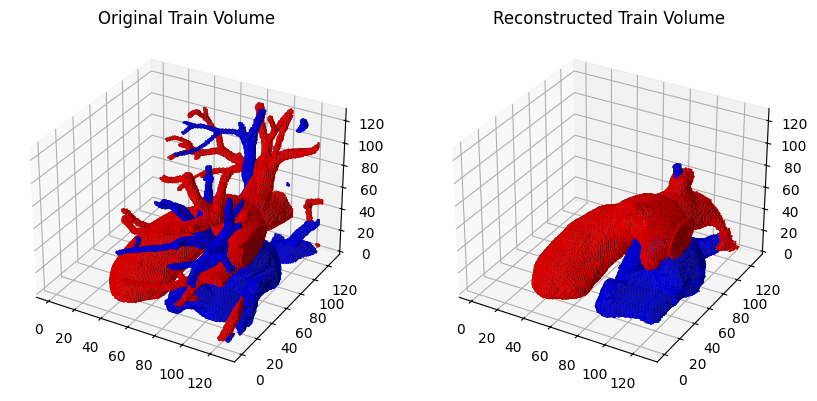

Validation: |          | 0/? [00:00<?, ?it/s]

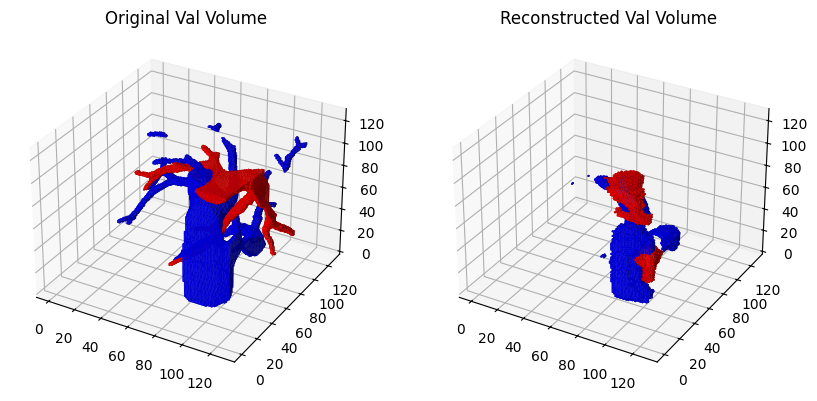

Time Spent 48818.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48852.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48886.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48919.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48952.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48985.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49019.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49052.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49085.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49119.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49153.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49187.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49221.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49257.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49290.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49326.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49359.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49395.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49428.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49463.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49497.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49530.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49566.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49600.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49634.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49667.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49703.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49736.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49770.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49803.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49838.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49871.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49905.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49941.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49974.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50008.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50042.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50077.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50111.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50147.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50181.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50214.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50248.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50281.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50315.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50348.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50382.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50416.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50450.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50486.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50519.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50553.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50586.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50620.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50655.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50689.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50722.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50756.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50792.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50825.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50860.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50894.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50927.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50962.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50995.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51031.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51065.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51099.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51133.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51166.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51200.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51234.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51267.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51302.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51335.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51369.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51402.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51437.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51471.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51504.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51538.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51572.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51605.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51639.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51672.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51706.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51741.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51776.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51811.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51846.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51880.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51915.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51949.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51983.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52017.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52052.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52086.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52120.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52153.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52189.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52223.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52256.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52292.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52326.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52361.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52394.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52428.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52461.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52497.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52532.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52566.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52599.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52633.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52667.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52700.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52736.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52772.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52805.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52838.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52872.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52907.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52940.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52974.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53010.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53046.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53079.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53115.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53148.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53183.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53217.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53250.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53286.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53319.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53353.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53387.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53420.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53455.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53489.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53522.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53556.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53589.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53624.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53657.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53691.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53725.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53759.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53792.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53825.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53861.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53896.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53931.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53966.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54000.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54034.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54069.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54104.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54137.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54170.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54203.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54239.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54273.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54308.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54342.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54377.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54413.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54449.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54482.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54516.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54549.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54583.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54618.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54653.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54687.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54720.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54754.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54788.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54822.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54856.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54889.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54923.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54959.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54994.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55027.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55062.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55096.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55130.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55163.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55197.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55231.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55264.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55297.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55331.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55364.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55398.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55432.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55466.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55500.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55533.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55567.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55603.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55636.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55670.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55704.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55737.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55770.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55805.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55839.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55873.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55907.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55940.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55974.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56007.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56040.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56076.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56109.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56144.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56178.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56214.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56247.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56281.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56314.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56348.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56383.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56417.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56451.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56486.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56520.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56555.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56588.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56622.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56656.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56690.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56725.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56759.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56792.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56826.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56860.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56895.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56928.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56962.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56995.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57029.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57063.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57098.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57132.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57167.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57201.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57236.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57269.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57307.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57340.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57373.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57407.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57440.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57473.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57506.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57541.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57575.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57610.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57645.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57681.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57715.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57748.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57781.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57814.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57849.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57882.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57916.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57951.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57984.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58017.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58052.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58086.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58119.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58153.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58186.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58219.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58253.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58286.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58321.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58355.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58389.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58423.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58456.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58492.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58525.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58558.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58593.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58627.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58660.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58693.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58726.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58760.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58793.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58827.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58864.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58899.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58933.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 58967.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 59003.73


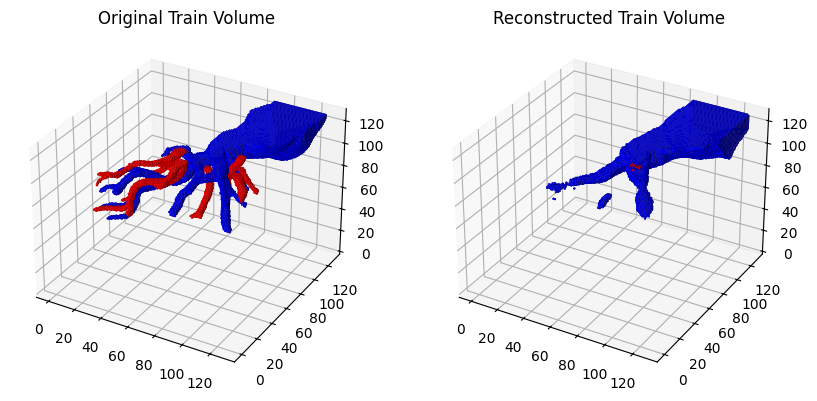

Validation: |          | 0/? [00:00<?, ?it/s]

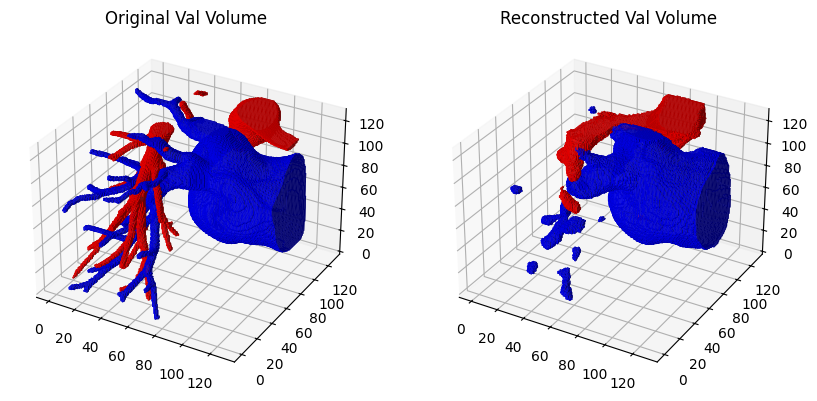

`Trainer.fit` stopped: `max_epochs=1501` reached.


Time Spent 59397.77


FIT Profiler Report

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Action                                                                                                                                                         	|  Mean duration (s)	|  Num calls      	|  Total time (s) 	|  Percentage %   	|
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Total                                                                                                                                                          	|  -              	|  723580         	|

In [3]:
model = AutoEncoderModel()
trainer.fit(model, train_dataloader, val_dataloader)

In [4]:
torch.save(model.state_dict(), folder_path + '/ae1.pth')